In [88]:
import numpy as np
import glob
import csv
from scipy.misc import imread
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
import cv2
import time
from datetime import timedelta

# Calibrating the Camera


In [89]:
checkerboard_file_list = []
for name in glob.glob('/home/deep_cat/sdc-P4/camera_cal/calibration*'):
    checkerboard_file_list.append(name)
    
print(checkerboard_file_list)

['/home/deep_cat/sdc-P4/camera_cal/calibration7.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration18.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration17.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration4.png', '/home/deep_cat/sdc-P4/camera_cal/calibration19.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration20.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration12.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration1.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration8.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration11.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration15.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration2.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration6.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration9.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration10.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration5.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration13.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration16.jpg', '/home/deep_cat/sdc-P4/camera_cal/c

True /home/deep_cat/sdc-P4/camera_cal/calibration7.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration18.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration17.jpg
False /home/deep_cat/sdc-P4/camera_cal/calibration4.png
True /home/deep_cat/sdc-P4/camera_cal/calibration19.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration20.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration12.jpg
False /home/deep_cat/sdc-P4/camera_cal/calibration1.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration8.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration11.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration15.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration2.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration6.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration9.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration10.jpg
False /home/deep_cat/sdc-P4/camera_cal/calibration5.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration13.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration16.j

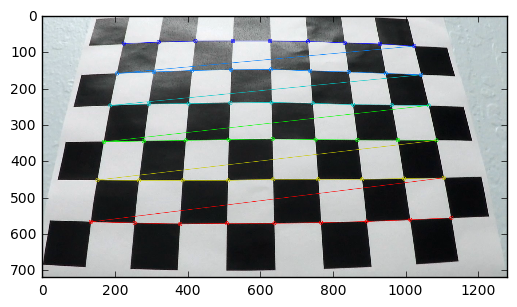

In [90]:
# this process creates the checkerboard points needed to 
# develop the calibration matrix

objpoints = []
imgpoints = []

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

for path in checkerboard_file_list: 
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    print(ret, path)

    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
    
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.imshow(img)


In [91]:
# this function generates the calibration matrix needed to undistort each future image from the camera

ret, mtx,dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

# Undistorting a test image

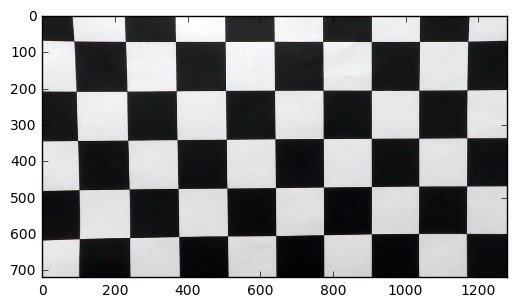

In [92]:
# going to try to undistort some of the ones that failed the previous stuff
# calibration 1 failed the original 

test_image = cv2.imread('/home/deep_cat/sdc-P4/camera_cal/calibration1.jpg')
undistorted_test_image = cv2.undistort(test_image, mtx, dist, None, mtx)
plt.imshow(undistorted_test_image)

# undistorting a car image

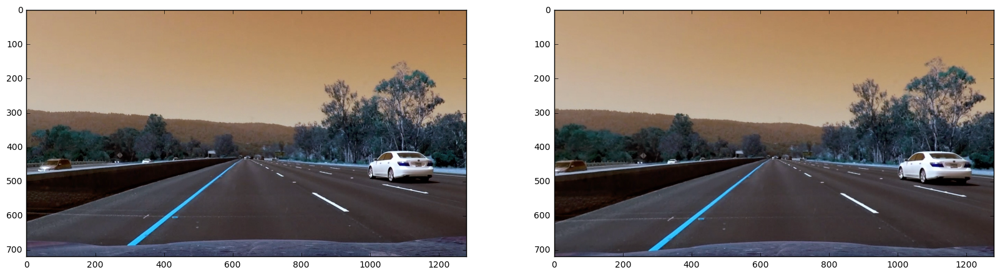

In [93]:
test7 = cv2.imread('/home/deep_cat/sdc-P4/test_images/test7.jpg')
undistorted = cv2.undistort(test7, mtx, dist, None, mtx)

f, (ax1,ax2) = plt.subplots(1,2, figsize = (20,10))
ax1.imshow(test7)
ax2.imshow(undistorted)


# Gradient thresholding functions


In [94]:
# the basic functions needed

# sobel , which thresholds for the magnitude of the gradient
def abs_sobel_thresh(img, orient='x', sobel_kernel = 3, thresh=(0,255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    
    scaled_sobel_x = np.uint8(255*abs_sobel_x / np.max(abs_sobel_x))
    scaled_sobel_y = np.uint8(255*abs_sobel_y / np.max(abs_sobel_y))
    
   
    
    sx_binary = np.zeros_like(scaled_sobel_x)
    sx_binary[(scaled_sobel_x >= thresh[0]) & (scaled_sobel_x <= thresh[1])] = 1  
       
    sy_binary = np.zeros_like(scaled_sobel_y)
    sy_binary[(scaled_sobel_y >= thresh[0]) & (scaled_sobel_y <= thresh[1])] = 1  
    
    if orient == 'x': 
        return sx_binary
        
    if orient == 'y':
        return sy_binary
    
    
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 5) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 6) Create a binary mask where mag thresholds are met
    # 7) Return this mask as your binary_output image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # abs_sobel_x = np.absolute(sobel_x)
    # abs_sobel_y = np.absolute(sobel_y)
    
    # scaled_sobel_x = np.uint8(255*abs_sobel_x / np.max(abs_sobel_x))
    # scaled_sobel_y = np.uint8(255*abs_sobel_y / np.max(abs_sobel_y))
    
    magnitude = np.sqrt((sobel_x**2) + (sobel_y**2))
    scale_factor = np.max(magnitude)/255
    magnitude=  (magnitude/scale_factor).astype(np.uint8)
    
    mag_binary= np.zeros_like(magnitude)
    mag_binary[(magnitude >= mag_thresh[0]) & (magnitude <= mag_thresh[1])] = 1  
       
   
    
    
    # binary_output = np.copy(img) # Remove this line
    return mag_binary


# thresholding the direction 

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    # Here I'm suppressing annoying error messages
    with np.errstate(divide='ignore', invalid='ignore'):
        absgraddir = np.absolute(np.arctan(sobely/sobelx))
        binary_output =  np.zeros_like(absgraddir)
        binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

# Run the function
# dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))

# Testing  the gradient functions on a test image



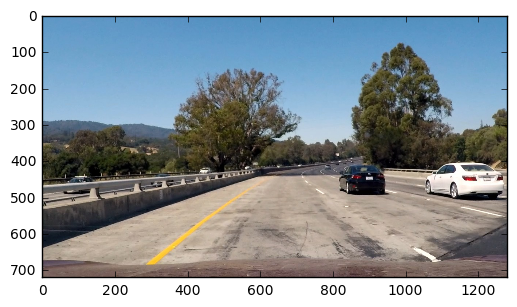

In [95]:
test6 = mpimg.imread('/home/deep_cat/sdc-P4/test_images/test.jpg') ## note: didn't use the cv2 import here
plt.imshow(test6)

In [149]:
# correcting the projection
test6_corrected = cv2.undistort(test6, mtx, dist, None, mtx)
cv2.imwrite('/home/deep_cat/sdc-P4/test_images/'+ 'undistorted_test6.jpg' , test7_corrected)

True

In [150]:
img = test6_corrected
ksize = 3
gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(20,100))
grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(20,100))
mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(20,110))
dir_binary = dir_threshold(img, sobel_kernel = 15, thresh=(0.9,1.1))

In [151]:
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1


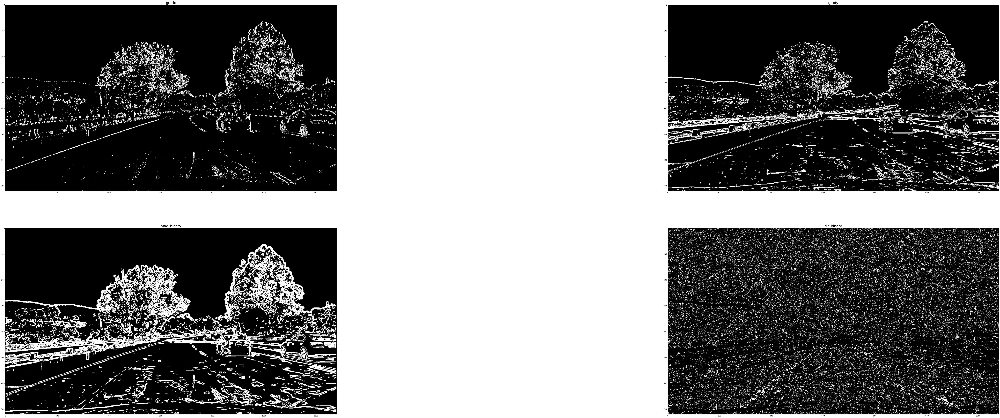

In [152]:
font_size = 20
f, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2, figsize=(96,36))
# f.tight_layout()
ax1.imshow(gradx, cmap='gray')
ax1.set_title('gradx', fontsize = font_size)
ax2.imshow(grady, cmap='gray')
ax2.set_title('grady', fontsize = font_size)
ax3.imshow(mag_binary, cmap='gray')
ax3.set_title('mag_binary', fontsize = font_size)
ax4.imshow(dir_binary, cmap='gray')
ax4.set_title('dir_binary', fontsize = font_size)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

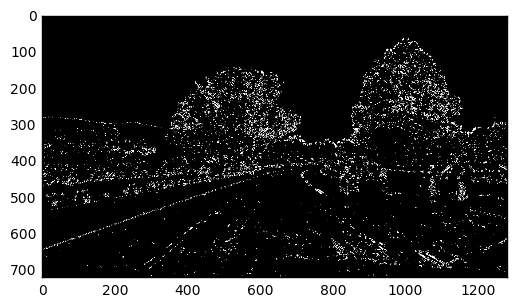

In [153]:
plt.imshow(combined, cmap='gray')

# Color thresholding

In [154]:
def hls_select(img, thresh=(0, 255)):

    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]
    binary_output =  np.zeros_like(s)
    binary_output[(s >= thresh[0]) & (s <= thresh[1])] = 1
    return binary_output

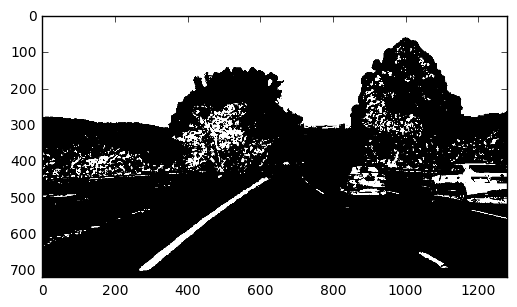

In [155]:
hls = hls_select(img, thresh = (100,255))
plt.imshow(hls, cmap='gray')

In [156]:
# Want to combine two images -- sobel x and color
# Combine the two binary thresholds
combined_binary = np.zeros_like(gradx)
combined_binary[(hls == 1) | (gradx == 1)] = 1

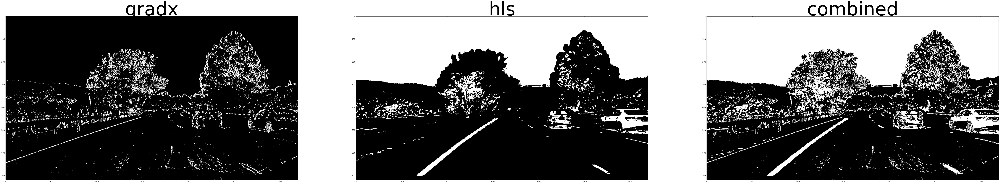

In [157]:
font_size = 100
f, (ax1,ax2,ax3) = plt.subplots(1,3, figsize=(96,36))
# f.tight_layout()
ax1.imshow(gradx, cmap='gray')
ax1.set_title('gradx', fontsize = font_size)
ax2.imshow(hls, cmap='gray')
ax2.set_title('hls', fontsize = font_size)
ax3.imshow(combined_binary, cmap='gray')
ax3.set_title('combined', fontsize = font_size)

# Developing the pipeline 

In [158]:
def pipeline(img):
    img = np.copy(img)
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]

    # Grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abssx = np.absolute(sobelx) # Absolute x derivative to accentuate strong verticalish lines
    scale_factor = np.max(abssx)/255 # Will use this to scale back to 8-bit scale
    abssx = (abssx/scale_factor).astype(np.uint8) #rescaling to 8-bit 

    # Threshold x gradient
    retval, sxbinary = cv2.threshold(abssx, 15, 150, cv2.THRESH_BINARY)
    # Threshold color channel
    retval, s_binary = cv2.threshold(s.astype('uint8'), 175, 255, cv2.THRESH_BINARY)

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    
    # creating a binary image by picking out the saturated layer
    hls = hls_select(color_binary, thresh = (100,255))
    return hls
    

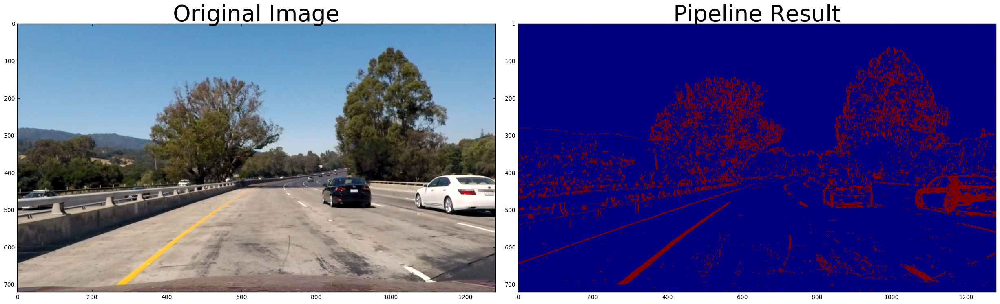

In [159]:
result = pipeline(img)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result)
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Perspective transform

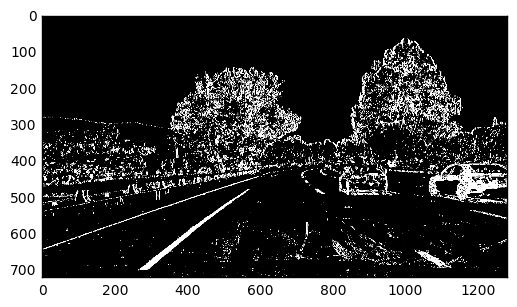

In [160]:
img = result
plt.imshow(result, cmap='gray')

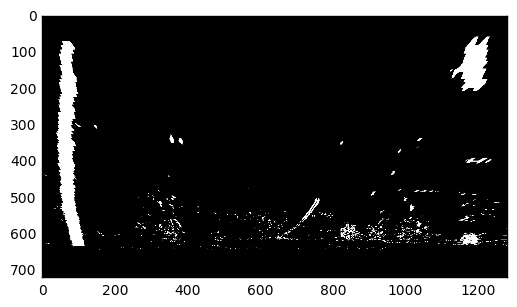

In [168]:
img_size = (img.shape[1], img.shape[0])
x_offset = 100
y_offset = 100
 # manually picked points 
src = np.float32([(570,480), (754, 480), (1084, 675), (310, 675)]) 
# src = np.float32([(604,450), (672,450), (1100,683), (330,683)])
dst = np.float32([[x_offset, y_offset], 
                  [img_size[0]-x_offset, y_offset], 
                  [img_size[0]-x_offset, img_size[1]-y_offset], 
                  [x_offset, img_size[1]-y_offset]])
                   
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst,src) # used later to lay the the polynomials back into the image
warped = cv2.warpPerspective(img, M, img_size)

plt.imshow(warped, cmap = 'gray')


/home/deep_cat/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


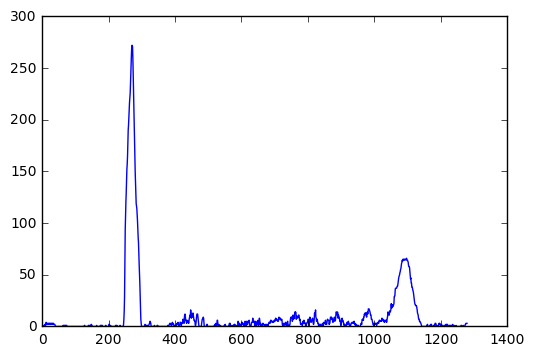

In [162]:
# this makes a histogram of the lower half of the image

histogram = np.sum(warped[warped.shape[0]/2:,:], axis=0)
plt.plot(histogram)

In [110]:
# now need to find the peaks of the histograms
from scipy import signal
peaks = signal.find_peaks_cwt(histogram, [100], min_length = 1,gap_thresh = 2, max_distances=[100]) 

print(peaks)

[161, 785, 1218]


In [111]:
np.max(peaks)

1218

In [112]:
np.min(peaks)

161

In [113]:
warped.shape

(720, 1280)

[152, 786, 1074]
[154, 1152]
[171, 1215]
[179, 1247]
[]
[]
[]
[]


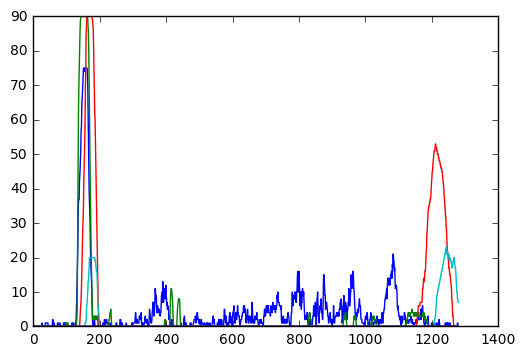

In [114]:
# leftyvals = []
# leftxvals = []
# rightxvals = []
# rightyvals = []
# window_buffer = 50

# left_lane_window = np.min(peaks)
# right_lane_window = np.max(peaks)
# for y in range(0, warped.shape[0]):
#     for x in range(0, warped.shape[1]):
#         pixel_value = warped[y,x]
#         if x > left_lane_window - window_buffer and x < left_lane_window + window_buffer : 
#             if pixel_value == 1:
#                 leftxvals.append(x)
#                 leftyvals.append(y)
#         if x > right_lane_window - window_buffer and x < right_lane_window + window_buffer : 
#             if pixel_value == 1:
#                 rightxvals.append(x)   
#                 rightyvals.append(y)
                
               

# VERSION 2

# sliding window algorithm 

batch = 90 # 720 / 90  = 8 sliding window 
warped.shape[1]/2                                   
for i in range(int(warped.shape[0]/batch)):
    start = warped.shape[0] - (batch*(i+1))
    end = start + batch

    histogram = np.sum(warped[start:end,:], axis=0)
    plt.plot(histogram)
    peaks = signal.find_peaks_cwt(histogram, [100], min_length = 1,gap_thresh = 2, max_distances=[100]) 
    
    print(peaks)

    
    #left lane pixels
#     for j in range(end-start):
#         histogram_window
    

                
                
                
                

In [115]:
end-start

90

In [116]:
len(rightyvals)

NameError: name 'rightyvals' is not defined

In [ ]:
# plotting the points 
plt.plot(rightxvals,rightyvals, 'ro')


# fitting a polynomial to the pixels


In [ ]:
import numpy as np
leftyvals = np.asarray(leftyvals)
leftxvals = np.asarray(leftxvals)
rightyvals = np.asarray(rightyvals)
rightxvals = np.asarray(rightxvals)

# synthetic yvals to make it even
yvals = np.linspace(0, 100, num=101)*7.2

# for the left lane 
left_fit_coefficients = np.polyfit(leftyvals, leftxvals, 2) # creates the coeeficients
left_fitx = left_fit_coefficients[0] * yvals ** 2 + left_fit_coefficients[1] * yvals + left_fit_coefficients[2]

# for the right lane 
right_fit_coefficients = np.polyfit(rightyvals, rightxvals,2) # creates the coeeficients
right_fitx = right_fit_coefficients[0] * yvals ** 2 + right_fit_coefficients[1] * yvals + right_fit_coefficients[2]



In [ ]:
yvals = np.linspace(0, 100, num=101)*7.2
yvals

In [ ]:
left_fit_coefficients

In [ ]:
right_fit_coefficients

In [ ]:
# plotting the lines
# plt.plot(leftxvals, leftyvals, 'o', color='red')
# plt.plot(rightxvals, rightyvals, 'o', color='blue')
# plt.xlim(0, 1280)
# plt.ylim(0, 720)
# plt.plot(left_fitx, leftyvals, color='green', linewidth=3)
# plt.plot(right_fitx, rightyvals, color='green', linewidth=3)
# plt.gca().invert_yaxis() # to visualize as we do the images
# plotting the lines
plt.plot(leftxvals, leftyvals, 'o', color='red')
plt.plot(rightxvals, rightyvals, 'o', color='blue')
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, yvals, color='green', linewidth=3)
plt.plot(right_fitx, yvals, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images


# Calculating the radius of curvature

In [ ]:
y_eval = np.max(yvals)
left_curverad = ((1 + (2*left_fit_coefficients[0]*y_eval + left_fit_coefficients[1])**2)**1.5) / np.absolute(2*left_fit_coefficients[0])
right_curverad = ((1 + (2*right_fit_coefficients[0]*y_eval + right_fit_coefficients[1])**2)**1.5) /  np.absolute(2*right_fit_coefficients[0])
print(left_curverad, right_curverad)

In [ ]:
y_eval

In [ ]:
left_fitx[0]

In [ ]:
# Define conversions in x and y from pixels space to meters

leftyvals = np.asarray(leftyvals)
leftxvals = np.asarray(leftxvals)
rightyvals = np.asarray(rightyvals)
rightxvals = np.asarray(rightxvals)

# synthetic yvals to make it even
yvals = np.linspace(0, 100, num=101)*7.2


ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meteres per pixel in x dimension

left_fit_cr = np.polyfit(leftyvals*ym_per_pix, leftxvals*xm_per_pix, 2)
right_fit_cr = np.polyfit(rightyvals*ym_per_pix, rightxvals*xm_per_pix, 2)

left_curverad = ((1 + (2*left_fit_cr[0]*y_eval + left_fit_cr[1])**2)**1.5) \
                             /np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval + right_fit_cr[1])**2)**1.5) \
                                /np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')

In [ ]:

# Create an image to draw the lines on
warp_zero = np.zeros_like(warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(test6_corrected, 1, newwarp, 0.3, 0)
plt.imshow(result)

# Drawing the lines back down on the road

In [ ]:
# this is a tip from 35. you have a warped binary image called warped, 
#and you have fit the lines with a polynomial and have arrays called 
#yvals, left_fitx and right_fitx, which represent the x and y pixel values of the lines. 
#You can then project those lines onto the original image as follows:

# Create an image to draw the lines on
warp_zero = np.zeros_like(warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(test6_corrected, 1, newwarp, 0.3, 0) # this wanted the pre-pipeline image for some reason 
plt.imshow(result)



In [ ]:
# moving the process to the video
# using this line class to retain values 
# one object for each of the Left and right lines.

# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None


In [ ]:

# junck 
# sliding window algorithm 

# batch = 90 # 720 / 90  = 8 sliding window 
# warped.shape[1]/2                                   
# for i in range(int(warped.shape[0]/batch)):
#     start = warped.shape[0] - (batch*(i+1))
#     end = start + batch

#     histogram = np.sum(warped[start:end,:], axis=0)

#     left_start = np.argmax(histogram[0:warped.shape[1]/2])
#     right_start = np.argmax(histogram[warped.shape[1]/2:warped.shape[1]])
#     print('batch: ', i, start, " ", end, left_start, right_start)
#     for j in range(start,end+1):
#         print("pixel row")
#

In [ ]:

# Assuming you are able to successfully detect lines with a sliding histogram 
# in the first frames. You can then use that polynomial to fit a bloated 
# polynomial ROI around the line area. Then extract the new polynomial 
# with a faster technique such as findNonZero + polyfit.

# test synthetic image for a curvier line 

In [ ]:
synthetic = mpimg.imread('/home/deep_cat/sdc-P4/test_images/curved_perspective_debug3.jpg')

In [ ]:
plt.imshow(synthetic)

In [ ]:
def make_polyline(warped, original_img):
    # this makes a histogram of the lower half of the image
    histogram = np.sum(warped[warped.shape[0]/2:,:], axis=0)
    ... keep going
    

In [ ]:
# diagnostic tool from john chen

    # middle panel text example
    # using cv2 for drawing text in diagnostic pipeline.
# font = cv2.FONT_HERSHEY_COMPLEX
# middlepanel = np.zeros((120, 1280, 3), dtype=np.uint8)
# cv2.putText(middlepanel, 'Estimated lane curvature: ERROR!', (30, 60), font, 1, (255,0,0), 2)
# cv2.putText(middlepanel, 'Estimated Meters right of center: ERROR!', (30, 90), font, 1, (255,0,0), 2)


# # assemble the screen example
# diagScreen = np.zeros((1080, 1920, 3), dtype=np.uint8)
# diagScreen[0:720, 0:1280] = mainDiagScreen
# diagScreen[0:240, 1280:1600] = cv2.resize(diag1, (320,240), interpolation=cv2.INTER_AREA) 
# diagScreen[0:240, 1600:1920] = cv2.resize(diag2, (320,240), interpolation=cv2.INTER_AREA)
# diagScreen[240:480, 1280:1600] = cv2.resize(diag3, (320,240), interpolation=cv2.INTER_AREA)
# diagScreen[240:480, 1600:1920] = cv2.resize(diag4, (320,240), interpolation=cv2.INTER_AREA)*4
# diagScreen[600:1080, 1280:1920] = cv2.resize(diag7, (640,480), interpolation=cv2.INTER_AREA)*4
# diagScreen[720:840, 0:1280] = middlepanel
# diagScreen[840:1080, 0:320] = cv2.resize(diag5, (320,240), interpolation=cv2.INTER_AREA)
# diagScreen[840:1080, 320:640] = cv2.resize(diag6, (320,240), interpolation=cv2.INTER_AREA)
# diagScreen[840:1080, 640:960] = cv2.resize(diag9, (320,240), interpolation=cv2.INTER_AREA)
# diagScreen[840:1080, 960:1280] = cv2.resize(diag8, (320,240), interpolation=cv2.INTER_AREA)


# some notes and links for reference
http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_template_matching/py_template_matching.html

http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_template_matching/py_template_matching.html


http://docs.opencv.org/2.4/modules/imgproc/doc/object_detection.html

https://carnd-forums.udacity.com/display/CAR/questions/32710479/lane-position-tracking

https://docs.scipy.org/doc/numpy/reference/generated/numpy.nonzero.html

john chen's thing 
https://carnd-forums.udacity.com/cq/viewquestion.action?id=32706990&questionTitle=want-to-create-a-diagnostic-view-into-your-lane-finding-pipeline


# running the process on video 
1. create a function for processing each frame
2. script for ring that function on the video file and creating a new processed video

In [ ]:
def process_image():
    
    
    return processed_frame

In [ ]:
white_output = 'white.mp4'
clip1 = VideoFileClip("solidWhiteRight.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
# %time white_clip.write_videofile(white_output, audio=False)
white_clip.write_videofile(white_output, audio=False)

In [169]:
# self.src_coords = np.float32([[240,719],
#                          [579,450],
#                          [712,450],
#                          [1165,719]])
#         # Dest coords for perspective xform
#         self.dst_coords = np.float32([[300,719],
#                          [300,0],
#                          [900,0],
#                          [900,719]])

IndentationError: unexpected indent (<ipython-input-169-c4b8d965643e>, line 6)

In [ ]:
 start = imshape[0]
    stop = 0 #masked_image.shape[0]/2 #0
    left_peaks = []
    right_peaks = []
    
    while  start > stop :
        histogram = np.sum(masked_image[start:,:], axis=0)
        
                                                    #0.02                           #100
        indexes = peakutils.indexes(histogram, thres=0.02/max(histogram), min_dist=120)
                                                                                   #120
        #print ('indexes',indexes)
        indexes = [x for x in indexes if x>500]
    

        try:
            
            #print('indexes ',indexes[0],indexes[1],start)   
            
            right_peaks.append(indexes[1])
            left_peaks.append(indexes[0])
            
        except IndexError:           
            #print("Unexpected error5:", sys.exc_info()[0])
            #print ("Index doesn't exist")
            pass 
        
        start -= 3.6    